In [25]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import shap
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import image_dataset_from_directory
import os
from keras.utils import load_img, img_to_array
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans

In [26]:
# Step 1: Load and preprocess the image dataset with higher resolution
data = image_dataset_from_directory(
    'flowers',
    image_size=(256, 256),
    batch_size=32
)

# Normalize images and prepare labels
images, labels = [], []
for image_batch, label_batch in data:
    images.append(image_batch.numpy())
    labels.append(label_batch.numpy())

images = np.concatenate(images) / 255.0
labels = np.concatenate(labels)

# Filter to include only 'rose' and 'sunflower' classes
mask = labels < 2
images, labels = images[mask], labels[mask]


Found 1517 files belonging to 2 classes.


In [27]:
# Step 2: Train a CNN model to output only 2 classes (rose, sunflower)
inputs = Input(shape=(256, 256, 3), name="Input")
x = Conv2D(32, 3, activation="relu", padding='same', name='Conv1')(inputs)
x = MaxPooling2D(2, name='Pool1')(x)
x = Conv2D(16, 3, activation="relu", padding='same', name='Conv2')(x)
x = MaxPooling2D(2, name='Pool2')(x)
x = Flatten(name='Vectorize')(x)
x = Dense(128, activation="relu", name="Dense1")(x)  # Embedding layer
x = Dense(2, name='FC')(x)  # Output only 2 classes now
outputs = Activation("softmax", name='Softmax')(x)

# Compile the CNN model
cnn_model = Model(inputs, outputs)
cnn_model.compile(optimizer=Adam(learning_rate=0.001), loss=CategoricalCrossentropy(), metrics=['acc'])

# Train the CNN
X_train, X_test, y_train, y_test = train_test_split(images, labels, stratify=labels, test_size=0.2, random_state=11)
cnn_model.fit(
    X_train,
    to_categorical(y_train, num_classes=2),
    validation_split=0.15,
    batch_size=32,
    epochs=5  # Keep epochs low for quicker training
)

Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 22s 541ms/step - acc: 0.5654 - loss: 2.2785 - val_acc: 0.8022 - val_loss: 0.4355
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 15s 460ms/step - acc: 0.8474 - loss: 0.3572 - val_acc: 0.8297 - val_loss: 0.3980
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 17s 519ms/step - acc: 0.8929 - loss: 0.2622 - val_acc: 0.8901 - val_loss: 0.3007
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 17s 513ms/step - acc: 0.9130 - loss: 0.2075 - val_acc: 0.8846 - val_loss: 0.3274
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 401ms/step - acc: 0.9475 - loss: 0.1628 - val_acc: 0.8571 - val_loss: 0.3773


In [28]:
#Extract embeddings from the CNN
def extract_embeddings(cnn_model, images):
    feature_extractor = Model(inputs=cnn_model.input, outputs=cnn_model.get_layer("Dense1").output)
    return feature_extractor.predict(images)

X_train_embed = extract_embeddings(cnn_model, X_train)
X_test_embed = extract_embeddings(cnn_model, X_test)

# Train an XGBoost classifier on the embeddings
xgb_model = XGBClassifier(eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train_embed, y_train)

38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:54, 54.10s/it]               


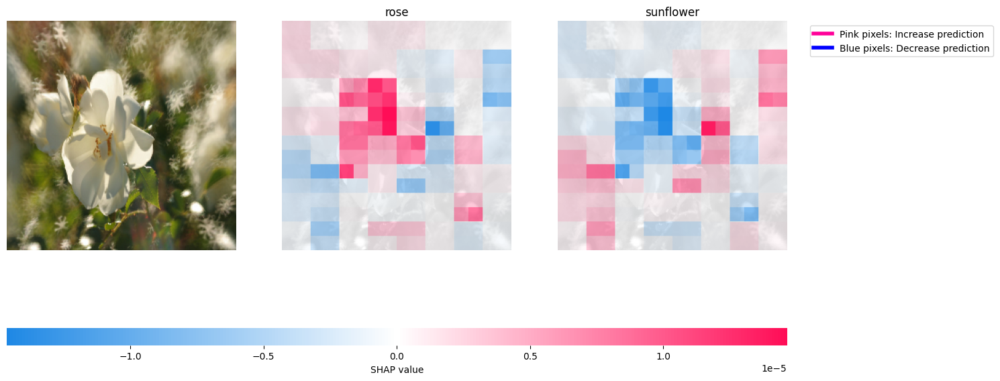

In [29]:
# SHAP Explainer
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_embed)

# SHAP Image Masker
def f(x):
    tmp = x.copy()
    return cnn_model(tmp)

masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

ind = [120]

shap_values_ = explainer(X_test[ind], max_evals=5000, batch_size=50)
# Plot SHAP values with custom legends
shap.image_plot(shap_values_, X_test[ind], labels=['rose', 'sunflower'], show=False)

legend_elements = [
    Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
    Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
plt.gcf().set_size_inches(15, 10)
plt.show()

c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


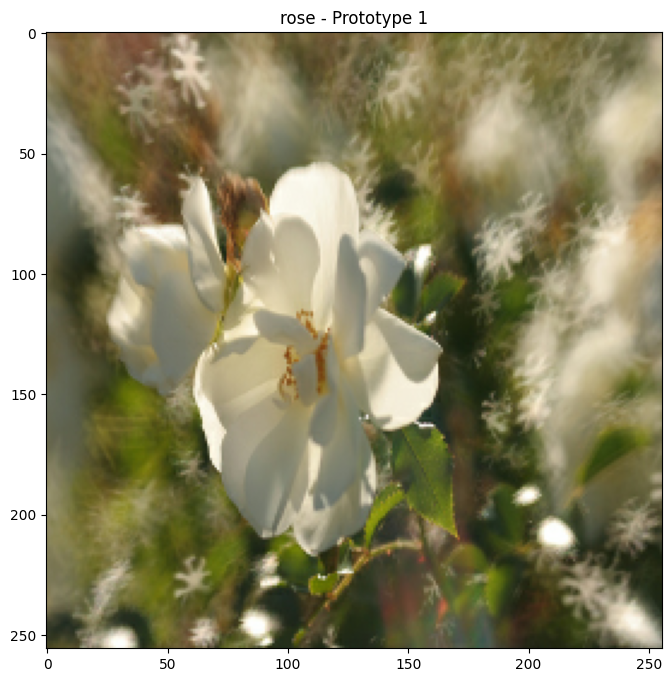

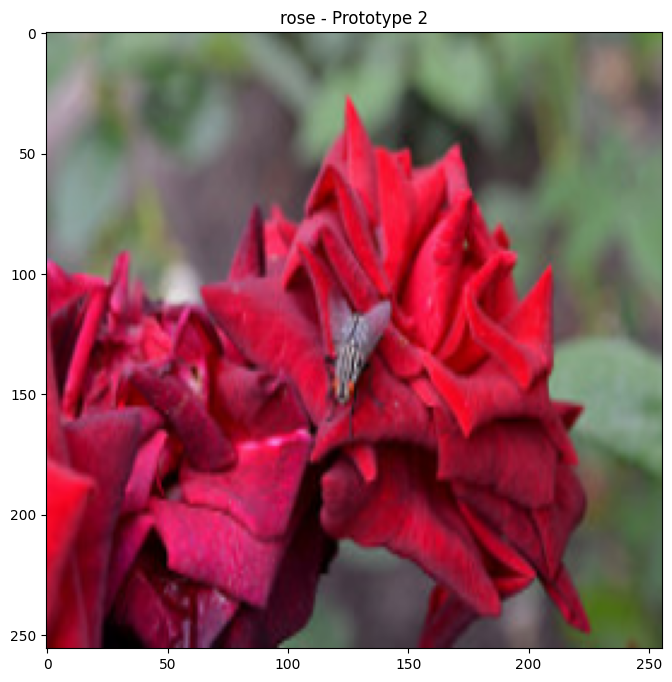

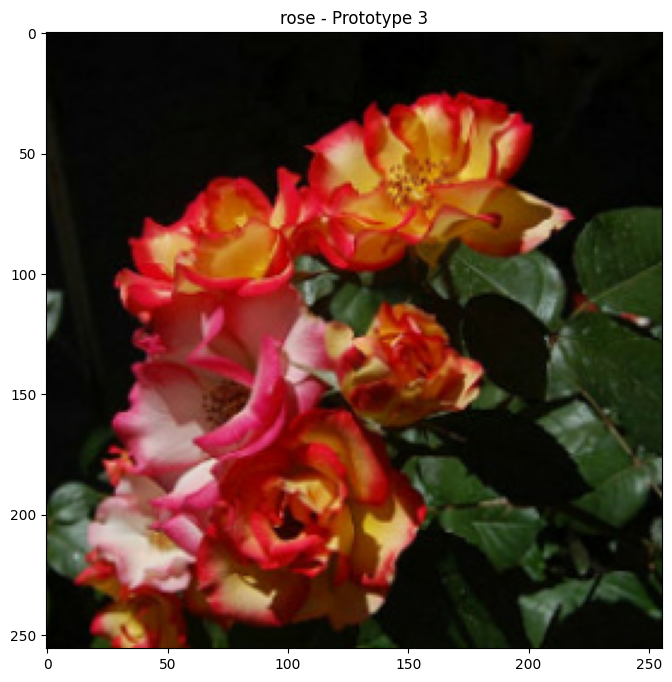

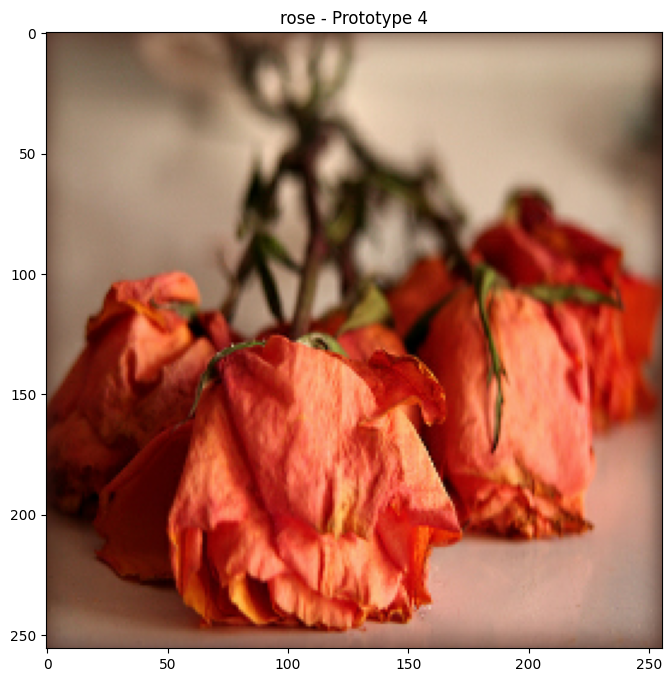

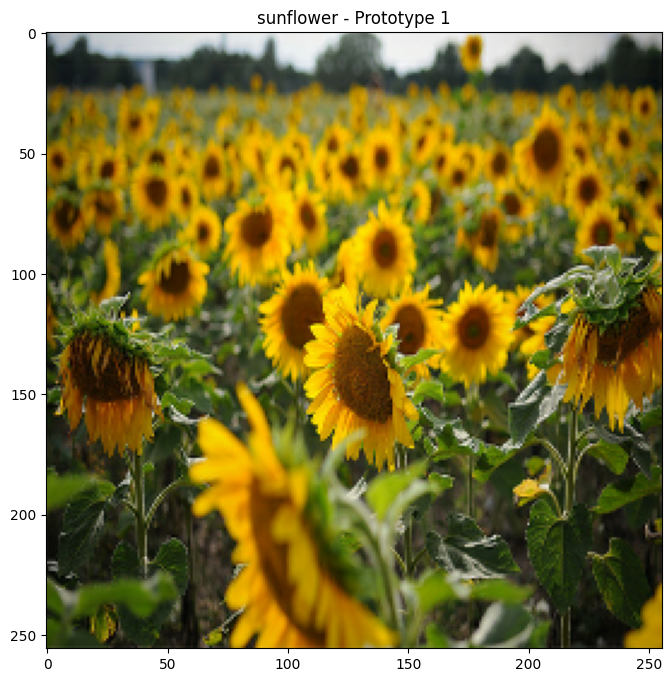

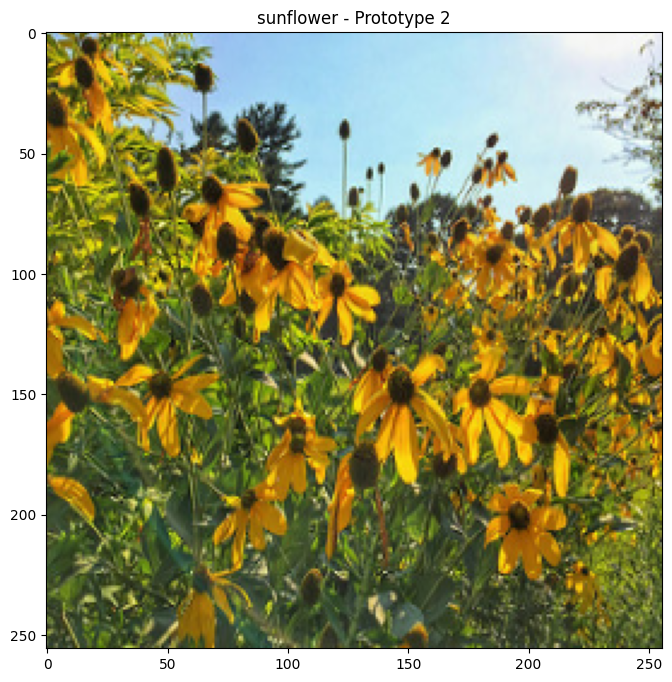

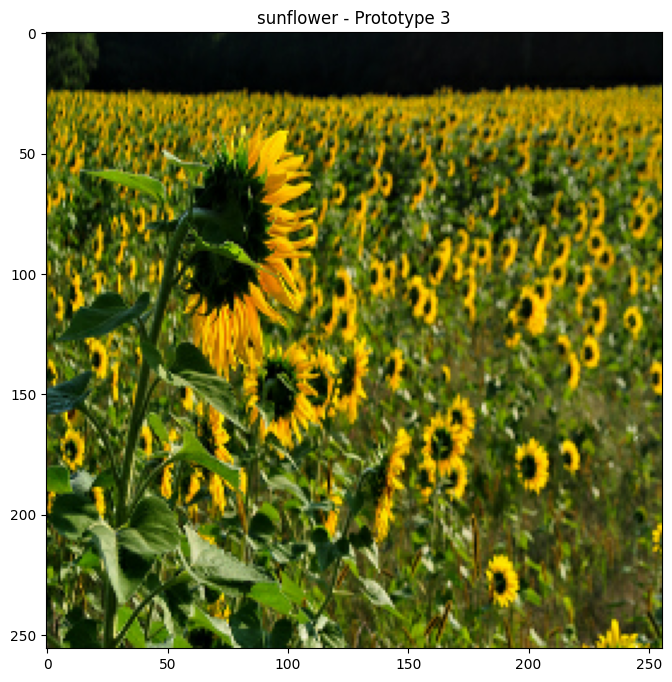

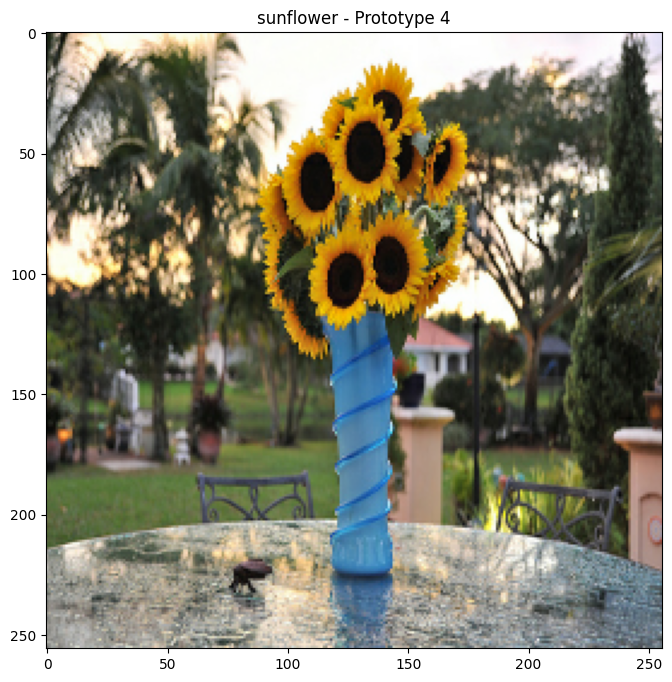

In [30]:
# Prototypes with K-means Clustering
def find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4):
    prototypes = []
    for class_label in np.unique(y_train):
        class_indices = np.where(y_train == class_label)[0]
        class_embeddings = X_train_embed[class_indices]
        
        kmeans = KMeans(n_clusters=n_prototypes, random_state=42).fit(class_embeddings)
        centroids = kmeans.cluster_centers_
        prototypes.append(centroids)
    
    return prototypes

prototypes = find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4)

# Visualize prototypes
def visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best'):
    for class_label, proto_centroids in enumerate(prototypes):
        for i, proto in enumerate(proto_centroids):
            distances = np.linalg.norm(X_test_embed - proto, axis=1)
            prototype_image_index = np.argmin(distances)
            
            plt.figure(figsize=(8, 8))
            plt.imshow(X_test[prototype_image_index])
            plt.title(f"{['rose', 'sunflower'][class_label]} - Prototype {i + 1}")
            plt.show()

visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:52, 52.16s/it]               


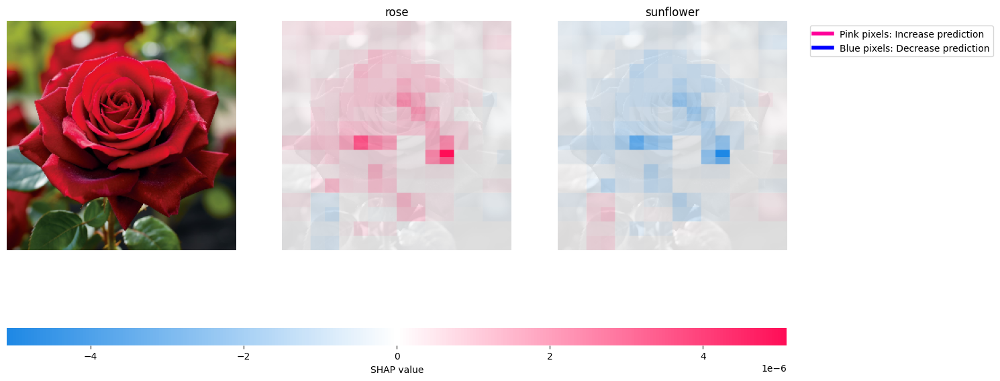

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:50, 50.60s/it]               


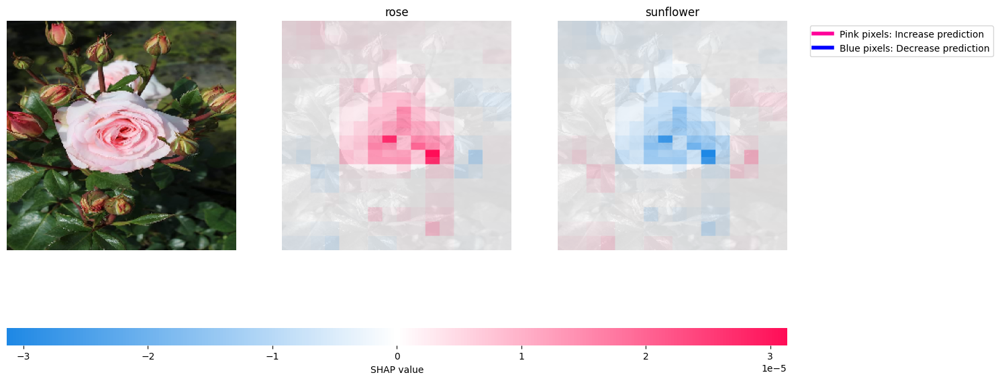

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:50, 50.74s/it]               


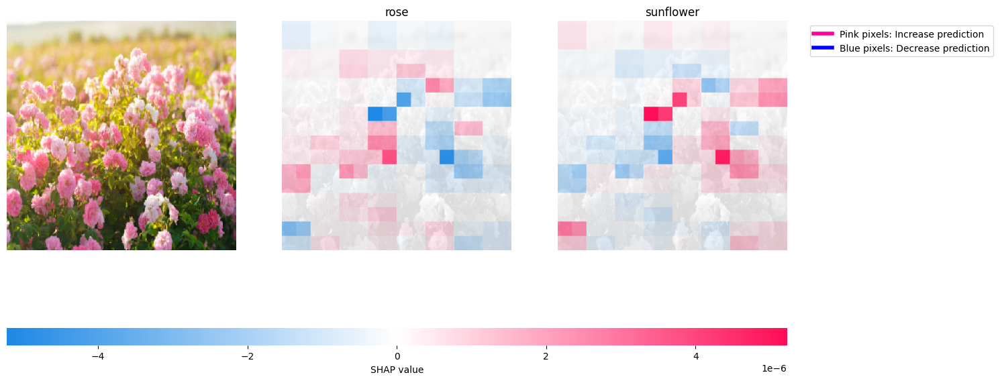

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:50, 50.91s/it]               


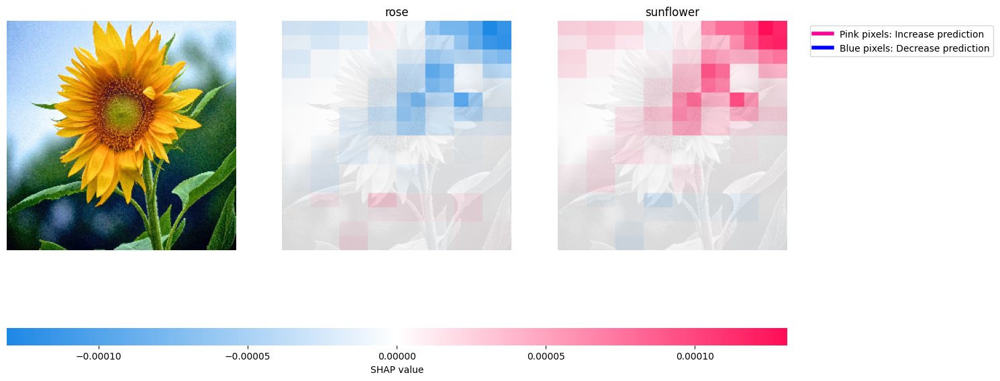

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:46, 46.68s/it]               


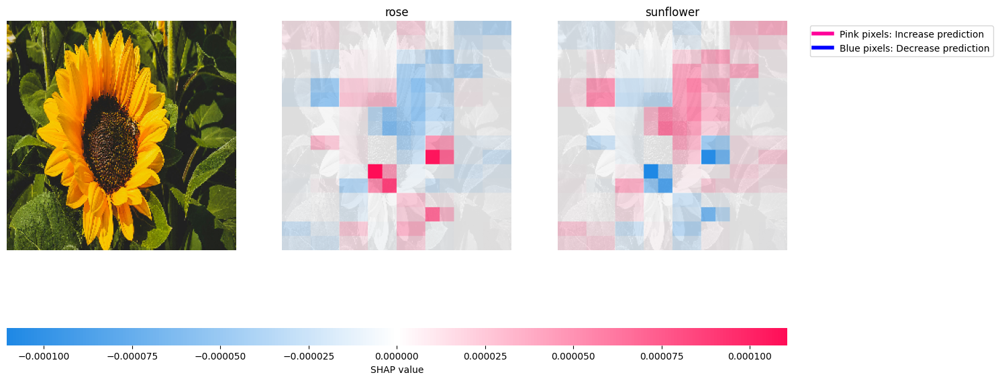

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:48, 48.75s/it]               


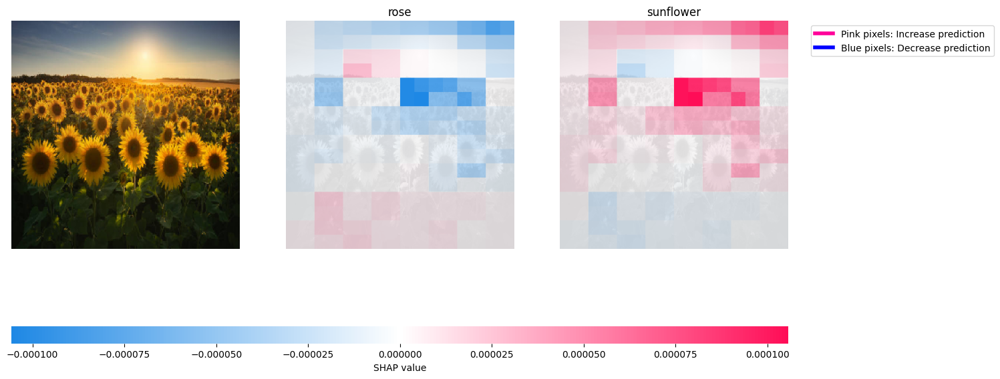

In [31]:
# Try SHAP and Prototypes with Additional Images
additional_images = []
for filename in os.listdir('test_images'):
    img = load_img(os.path.join('test_images', filename), target_size=(256, 256))
    img = img_to_array(img) / 255.0
    additional_images.append(img)

additional_images = np.array(additional_images)
additional_embeddings = extract_embeddings(cnn_model, additional_images)
additional_predictions = xgb_model.predict(additional_embeddings)

for i, image in enumerate(additional_images):
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
    shap.image_plot(shap_values_, image[np.newaxis, ...], labels=['rose', 'sunflower'], show=False)

    legend_elements = [
        Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
        Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
    ]

    plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
    plt.gcf().set_size_inches(15, 10)
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


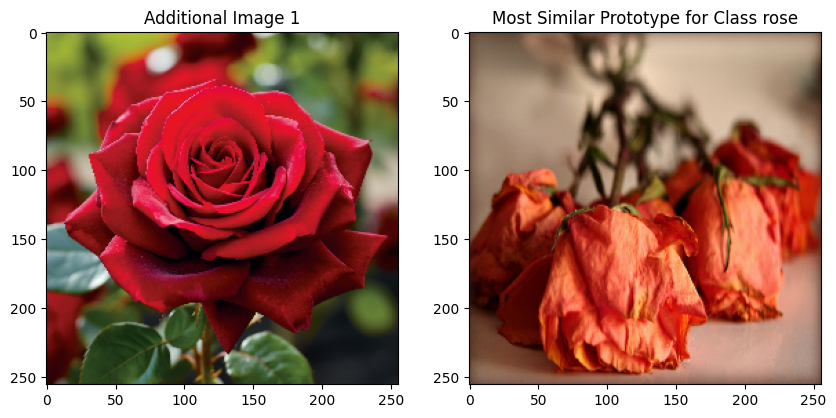

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


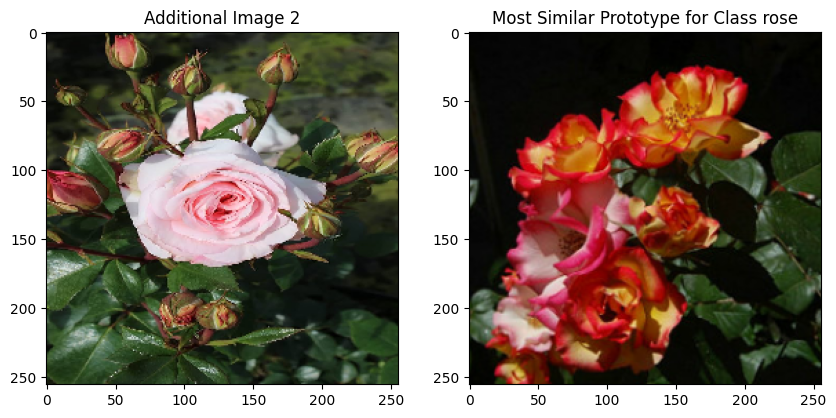

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


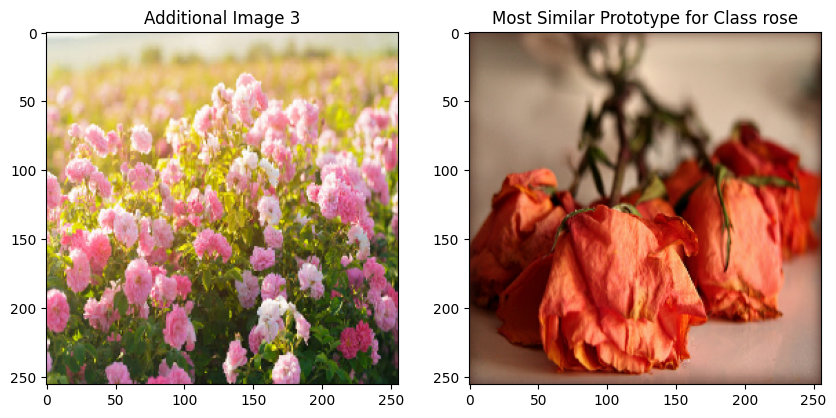

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


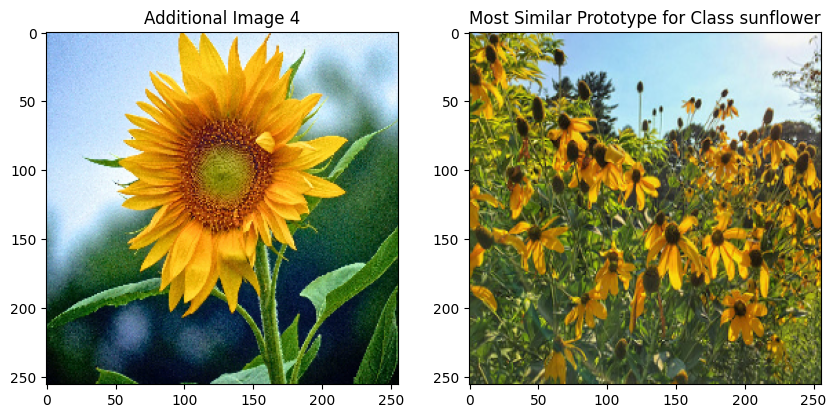

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


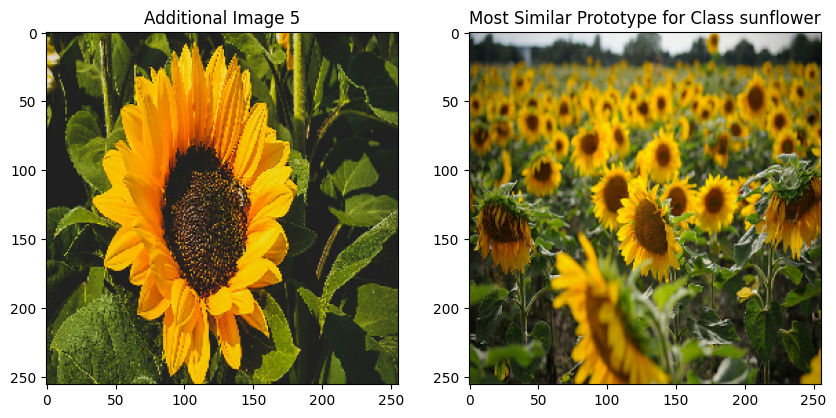

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


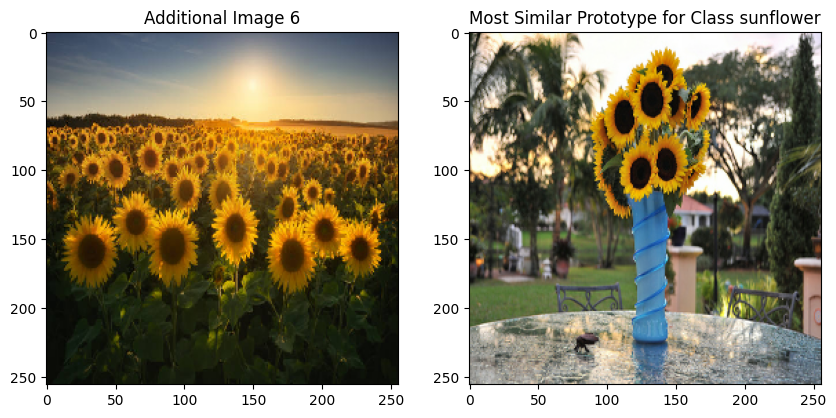

In [32]:
def match_prototypes(extra_embed, prototypes):
    min_distance = float('inf')
    closest_prototype = None
    for class_prototypes in prototypes:
        for proto in class_prototypes:
            distance = np.linalg.norm(extra_embed - proto)
            if distance < min_distance:
                min_distance = distance
                closest_prototype = proto
    return closest_prototype

for i, image in enumerate(additional_images):
    most_similar_prototype = match_prototypes(additional_embeddings[i], prototypes)

    predicted_class = np.argmax(cnn_model.predict(image[np.newaxis, ...]))
    class_name = ['rose', 'sunflower'][predicted_class]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Additional Image {i + 1}")
    plt.subplot(1, 2, 2)
    plt.imshow(X_test[np.argmin(np.linalg.norm(X_test_embed - most_similar_prototype, axis=1))])
    plt.title(f"Most Similar Prototype for Class {class_name}")
    plt.show()

### Another Approach for Shap Images


In [34]:
def custom_feature_importance_visualization(model, image, explainer, class_names):
   
    predictions = model.predict(image[np.newaxis, ...], verbose=0)
    predicted_class = np.argmax(predictions)
    
   
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
    shap_array = shap_values_[0, :, :, :, predicted_class].values
    shap_array_norm = (shap_array - shap_array.min()) / (shap_array.max() - shap_array.min())
    
    importance_scores = np.abs(shap_array_norm).sum(axis=2)
    
    
    plt.figure(figsize=(10, 5))
    
   
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Image')
    plt.axis('off')
    
   
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    
   

    custom_cmap = plt.cm.YlOrRd
    plt.imshow(importance_scores, alpha=0.7, cmap=custom_cmap)
    plt.title(f'Feature Importance Overlay\n{class_names[predicted_class]}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return predicted_class

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:52, 52.78s/it]               


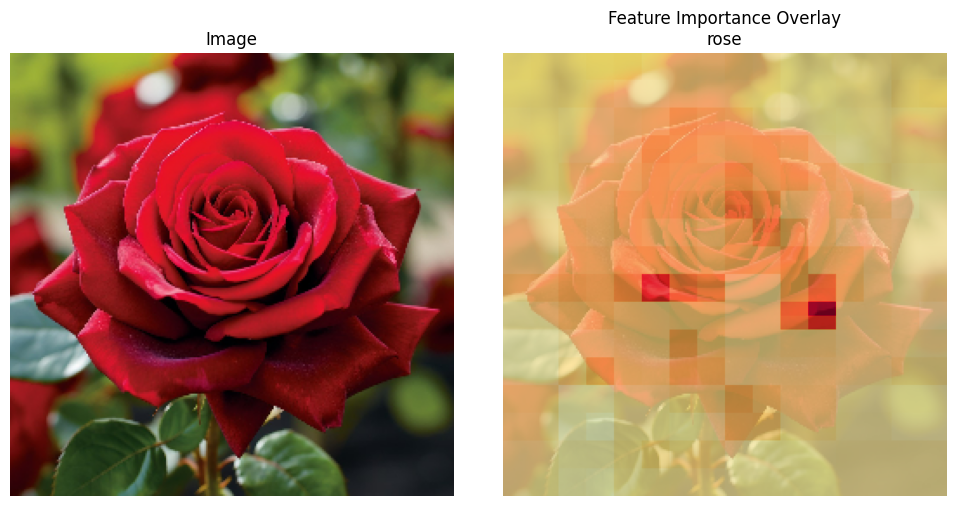

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:46, 46.85s/it]               


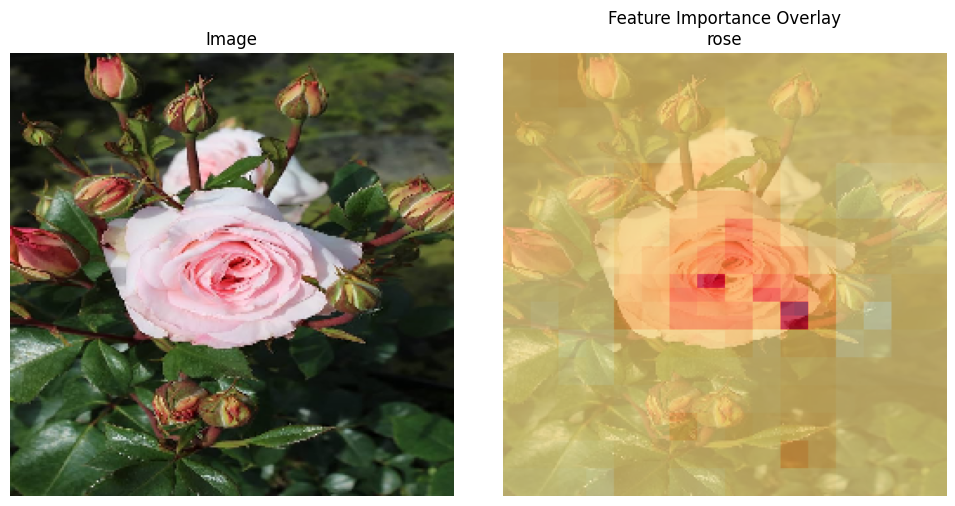

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:48, 48.88s/it]               


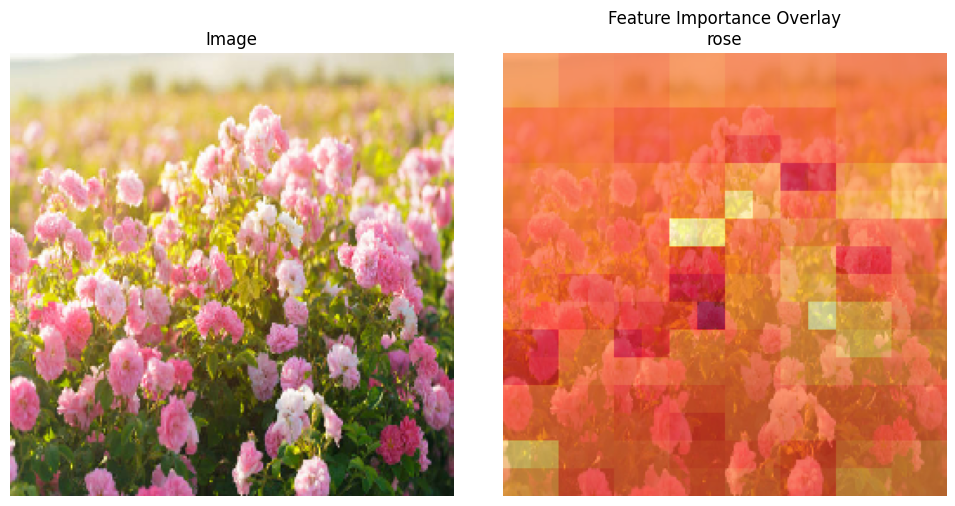

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.12s/it]               


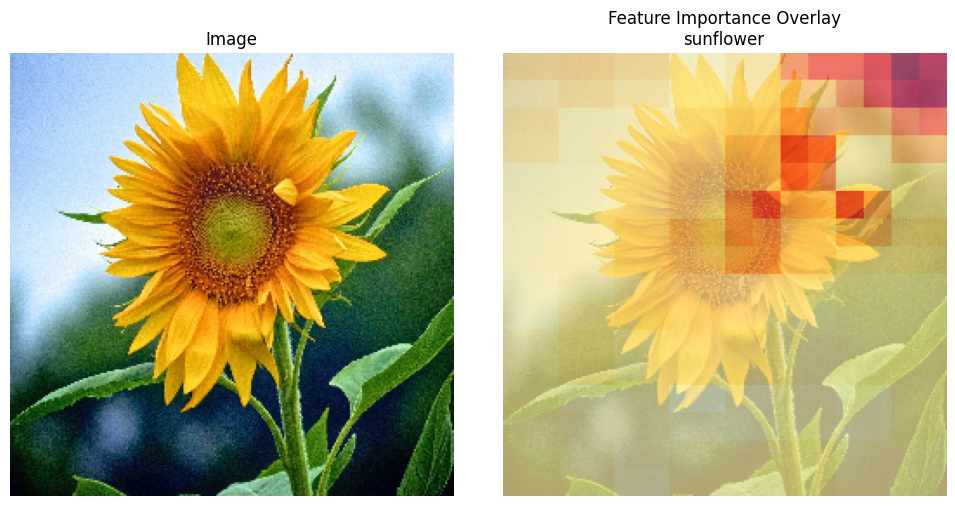

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:48, 48.07s/it]               


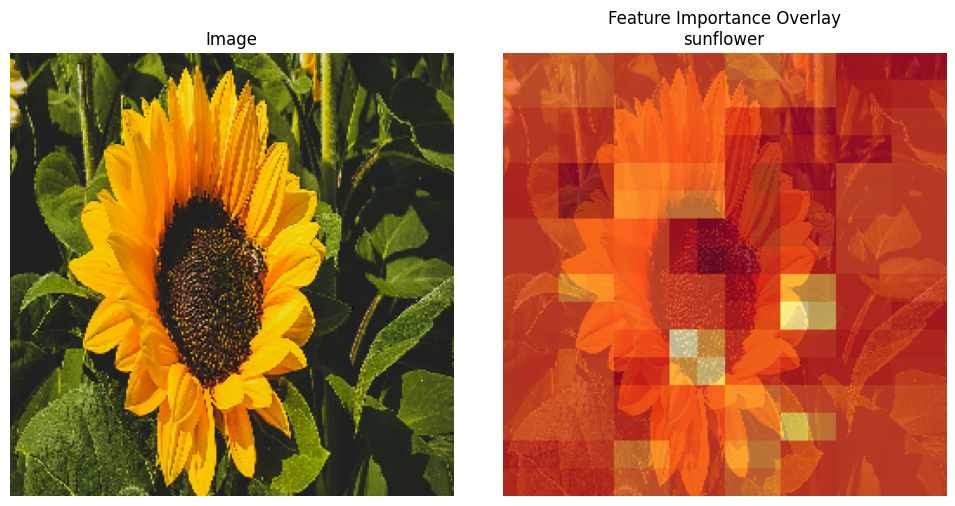

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:51, 51.39s/it]               


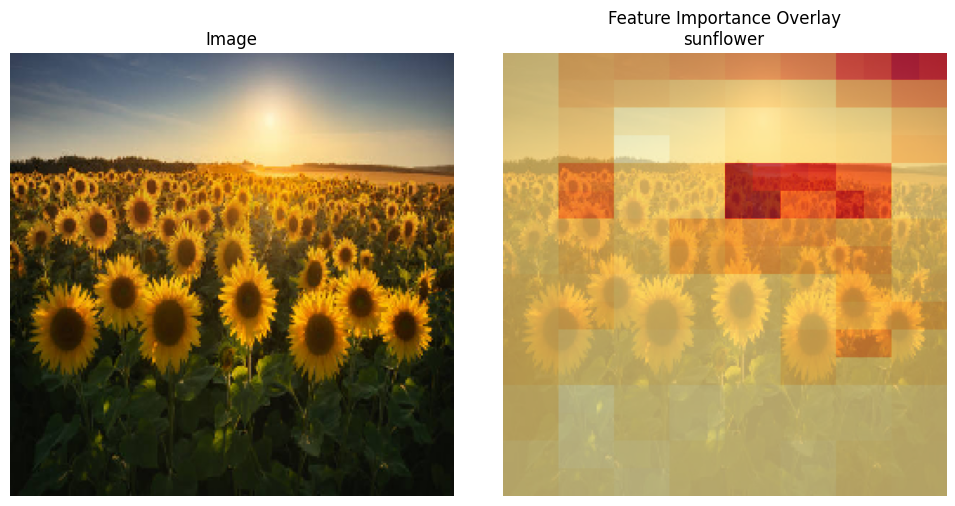

In [35]:
masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

class_names = ['rose', 'sunflower']


for image in additional_images:
    custom_feature_importance_visualization(cnn_model, image, explainer, class_names)